In [328]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression,Lasso,LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.model_selection import cross_val_score
import pickle as pkl

In [329]:
df1= pd.read_excel('Flipnwork_Train.xlsx')
df2= pd.read_excel('Flipnwork_Test.xlsx')
df = pd.concat([df1,df2]).reset_index(drop=True)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
display(df.tail())

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,468.0,TA,TA,PConc,Gd,TA,No,GLQ,33,Unf,0,1530,1563,GasA,Ex,Y,SBrkr,1563,0,0,1563,0,0,2,0,3,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,758,TA,TA,Y,144,99,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,NaN
1456,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,5,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,686,Unf,0,304,990,GasA,Ex,Y,SBrkr,990,0,0,990,0,1,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1996.0,Unf,2,672,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,NaN
1457,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,NaN
1458,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Feedr,Norm,1Fam,1.5Fin,6,7,1947,1950,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,Gd,CBlock,TA,TA,No,ALQ,399,Unf,0,605,1004,GasA,Ex,Y,SBrkr,1004,660,0,1664,0,0,2,0,3,1,TA,7,Typ,2,Gd,Detchd,1950.0,Unf,2,420,TA,TA,Y,0,24,36,0,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal,NaN
1459,1379,160,RM,21.0,1953,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,6,5,1973,1973,Gable,CompShg,HdBoard,HdBoard,BrkFace,408.0,TA,TA,CBlock,TA,Fa,No,BLQ,309,Unf,0,174,483,GasA,TA,Y,SBrkr,483,504,0,987,0,0,1,1,2,1,TA,5,Typ,0,NaN,Detchd,1973.0,Unf,1,264,TA,TA,Y,72,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN


In [330]:
df.shape

(1460, 81)

In [331]:
[i for i in df.columns if df[i].isnull().sum()>0]

['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SalePrice']

In [332]:
numerical_features = df3.select_dtypes(include=[int]).columns

In [333]:
numerical_features

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [334]:
for i in numerical_features:
    if df[i].isnull().sum()>0:
        print(i)

In [335]:
categorical_features = df.select_dtypes(exclude=[int]).columns

In [336]:
for i in categorical_features:
    if df[i].isnull().sum()>0:
        if df[i].count()<300:
            print(i)

Alley
PoolQC
Fence
MiscFeature


In [337]:
df3 = df.drop(['Id','Alley','PoolQC','MiscFeature','Fence'],axis=1)

In [338]:
[i for i in df3.columns if df3[i].isnull().sum()>0]

['LotFrontage',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'SalePrice']

In [339]:
Missing_Data = ['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond',]

In [340]:
Numerical,Categorical = [],[]
for i in Missing_Data:
    if (df3[i].dtype) == 'float64':
        Numerical.append(i)
    else:
        Categorical.append(i)

In [341]:
Categorical

['MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond']

In [342]:
Numerical

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [343]:
for i in Categorical:
    df3[i] = df3[i].fillna(df3[i].dropna().mode()[0])

In [344]:
for i in Numerical:
    df3[i] = df3[i].fillna(df3[i].mean())

In [345]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [346]:
df3.select_dtypes(include=['object']).columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [347]:
category = ['LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'SaleType', 'SaleCondition']

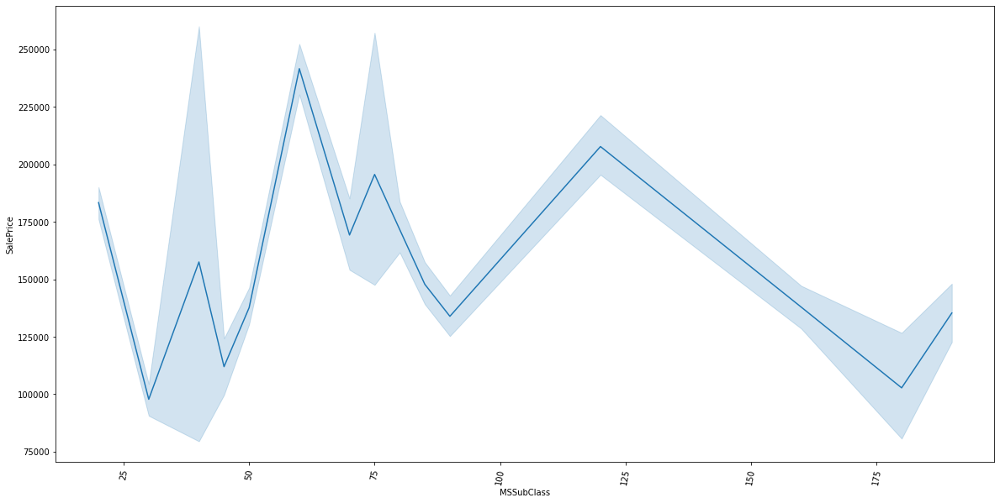

In [34]:
plt.figure(figsize=(20,10))
sns.lineplot(x="MSSubClass", y="SalePrice", data=df3)
plt.xticks(rotation=80)
plt.show()

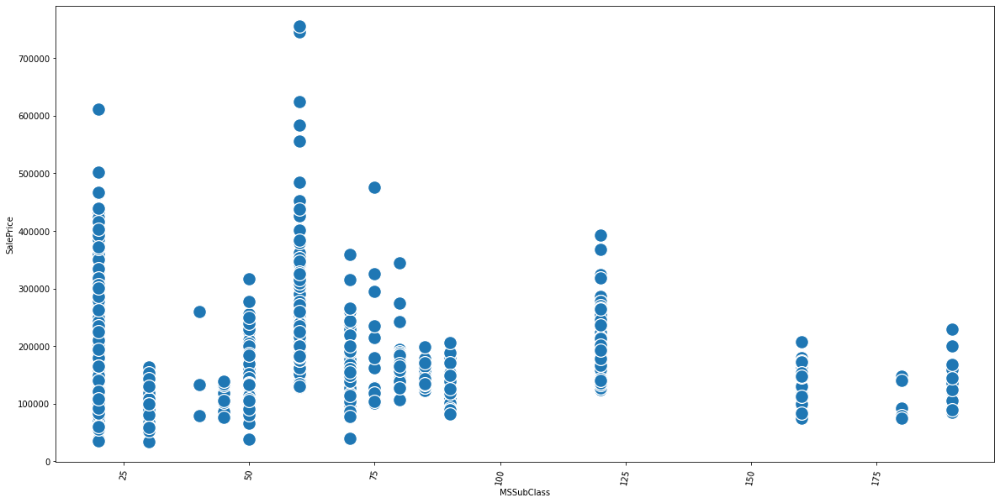

In [202]:
plt.figure(figsize=(20,10))
sns.scatterplot(x="MSSubClass", y="SalePrice", data=df3,s=250)
plt.xticks(rotation=80)
plt.show()

In [252]:
def crosstab(a):
    return pd.concat([df1[a].value_counts().sort_index(),df1.groupby(a)['SalePrice'].mean().sort_index()],axis=1)

In [316]:
df1['MSSubClass'].value_counts().idxmax()

20

In [309]:
df1.groupby('MSSubClass')['SalePrice'].mean()

MSSubClass
20     183321.390187
30     97774.057692 
40     157500.000000
45     111960.000000
50     137626.194690
60     241584.430328
70     169231.509434
75     195571.428571
80     171607.441860
85     147800.000000
90     133871.609756
120    207705.289855
160    137861.382979
180    102750.000000
190    135303.846154
Name: SalePrice, dtype: float64

In [303]:
df1.groupby(a)['SalePrice'].mean().idxmin()

6.0

In [317]:
Mostly_Available,Less_Available,Costly,Cheap = [],[],[],[]
for i in df1.columns:
    Mostly_Available.append(df1[i].value_counts().idxmax())
    Less_Available.append(df1[i].value_counts().idxmin())
    Costly.append(df1.groupby(i)['SalePrice'].mean().idxmax())
    Cheap.append(df1.groupby(i)['SalePrice'].mean().idxmin())

In [323]:
data = pd.DataFrame(zip(Mostly_Available,Less_Available,Costly,Cheap),columns=('Mostly_Available','Less_Available','Costly','Cheap'))

In [324]:
data.to_excel("data.xlsx")

In [446]:
data

,Mostly_Available,Less_Available,Costly,Cheap
0,127,127,692,496
1,20,40,60,30
2,RL,C (all),FV,C (all)
3,60.0,38.0,160.0,153.0
4,9600,7407,21535,7879
5,Pave,Grvl,Pave,Grvl
6,Grvl,Pave,Pave,Grvl
7,Reg,IR3,IR2,Reg
8,Lvl,Low,HLS,Bnk
9,AllPub,AllPub,AllPub,AllPub


<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

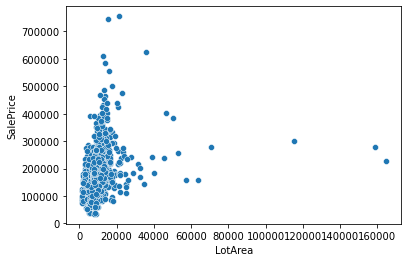

In [259]:
sns.scatterplot(x='LotArea',y='SalePrice',data=df1)

In [260]:
crosstab('Street')

,Street,SalePrice
Grvl,4,121110.750000
Pave,1164,181684.450172


In [261]:
crosstab('LotShape')

,LotShape,SalePrice
IR1,390,206038.464103
IR2,32,233827.750000
IR3,6,226120.833333
Reg,740,165906.660811


In [262]:
crosstab('LandContour')

,LandContour,SalePrice
Bnk,50,146163.140000
HLS,42,214302.166667
Low,30,194393.333333
Lvl,1046,181476.572658


In [263]:
crosstab('Utilities')

,Utilities,SalePrice
AllPub,1168,181477.005993


In [264]:
crosstab('LotConfig')

,LotConfig,SalePrice
Corner,222,182427.635135
CulDSac,69,224594.463768
FR2,33,171138.636364
FR3,2,221500.000000
Inside,842,178003.105701


In [265]:
crosstab('LandSlope')

,LandSlope,SalePrice
Gtl,1105,181203.795475
Mod,51,185353.313725
Sev,12,190160.833333


In [266]:
crosstab('Neighborhood')

,Neighborhood,SalePrice
Blmngtn,15,195987.000000
Blueste,2,137500.000000
BrDale,11,104081.818182
BrkSide,50,122836.000000
ClearCr,24,216120.833333
CollgCr,118,199517.508475
Crawfor,45,208474.688889
Edwards,83,128544.216867
Gilbert,64,194790.093750
IDOTRR,30,101322.666667


In [268]:
crosstab('Condition1')

,Condition1,SalePrice
Artery,38,137926.315789
Feedr,67,142799.731343
Norm,1005,184692.003980
PosA,6,237833.333333
PosN,17,219264.705882
RRAe,9,139044.444444
RRAn,20,190074.850000
RRNe,2,190750.000000
RRNn,4,238000.000000


In [269]:
crosstab('Condition2')

,Condition2,SalePrice
Artery,2,106500.000000
Feedr,6,121166.666667
Norm,1154,181697.129983
PosA,1,325000.000000
PosN,2,284875.000000
RRAe,1,190000.000000
RRAn,1,136905.000000
RRNn,1,125000.000000


In [270]:
crosstab('BldgType')

,BldgType,SalePrice
1Fam,981,185602.300714
2fmCon,27,133737.037037
Duplex,41,133871.609756
Twnhs,29,139437.931034
TwnhsE,90,186066.111111


In [271]:
crosstab('HouseStyle')

,HouseStyle,SalePrice
1.5Fin,121,138546.363636
1.5Unf,12,113216.666667
1Story,578,175940.826990
2.5Fin,7,223285.714286
2.5Unf,10,158690.000000
2Story,361,212193.515235
SFoyer,32,137508.000000
SLvl,47,170140.851064


In [272]:
crosstab('OverallQual')

,OverallQual,SalePrice
1,2,50150.000000
2,3,51770.333333
3,16,88498.437500
4,93,110892.086022
5,314,133340.378981
6,295,162520.711864
7,260,207887.973077
8,138,273051.804348
9,32,371024.093750
10,15,437554.066667


In [273]:
crosstab('OverallCond')

,OverallCond,SalePrice
1,1,61000.000000
2,5,141986.400000
3,21,97082.619048
4,43,122652.534884
5,640,203857.342188
6,209,155387.526316
7,172,160519.186047
8,61,160398.770492
9,16,221443.750000


In [274]:
crosstab('YearBuilt')

,YearBuilt,SalePrice
1875,1,94000.000000
1880,4,200619.750000
1882,1,168000.000000
1890,1,124900.000000
1892,1,475000.000000
1893,1,325000.000000
1898,1,106000.000000
1900,8,115865.750000
1904,1,157500.000000
1905,1,163000.000000


<AxesSubplot:xlabel='YearBuilt', ylabel='SalePrice'>

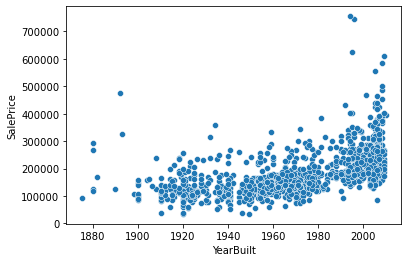

In [275]:
sns.scatterplot(x='YearBuilt',y='SalePrice',data=df1)

In [276]:
crosstab('YearRemodAdd')

,YearRemodAdd,SalePrice
1950,146,118662.493151
1951,4,129975.000000
1952,4,117498.250000
1953,8,160812.500000
1954,11,121818.181818
1955,7,124657.142857
1956,9,127261.111111
1957,8,128488.500000
1958,12,129033.333333
1959,13,137873.076923


<AxesSubplot:xlabel='YearRemodAdd', ylabel='SalePrice'>

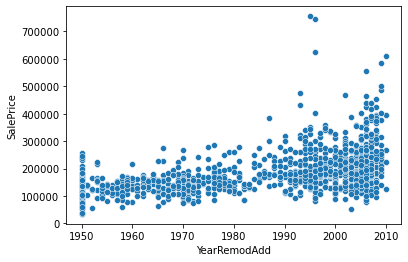

In [277]:
sns.scatterplot(x='YearRemodAdd',y='SalePrice',data=df1)

In [278]:
crosstab('RoofStyle')

,RoofStyle,SalePrice
Flat,12,204080.833333
Gable,915,173251.570492
Gambrel,9,145111.111111
Hip,225,214493.364444
Mansard,5,194795.800000
Shed,2,225000.000000


In [279]:
crosstab('RoofMatl')

,RoofMatl,SalePrice
ClyTile,1,160000.000000
CompShg,1144,180009.329545
Membran,1,241500.000000
Metal,1,180000.000000
Roll,1,137000.000000
Tar&Grv,10,195747.000000
WdShake,4,254250.000000
WdShngl,6,390250.000000


In [280]:
crosstab('Exterior1st')

,Exterior1st,SalePrice
AsbShng,19,107774.263158
AsphShn,1,100000.000000
BrkComm,1,60000.000000
BrkFace,41,198391.463415
CemntBd,42,242928.476190
HdBoard,179,163432.648045
ImStucc,1,262000.000000
MetalSd,178,148498.196629
Plywood,93,178890.075269
Stone,2,258500.000000


In [254]:
df3.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

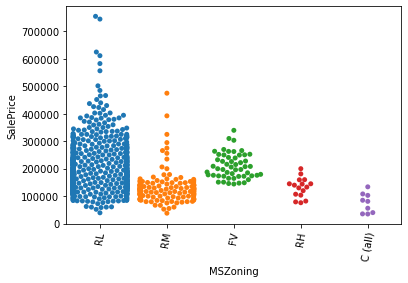

In [37]:
sns.swarmplot(x='MSZoning',y='SalePrice',data=df3)
plt.xticks(rotation=80)
plt.show()

(array([0, 1, 2, 3]),
 [Text(0, 0, 'IR1'), Text(1, 0, 'Reg'), Text(2, 0, 'IR2'), Text(3, 0, 'IR3')])

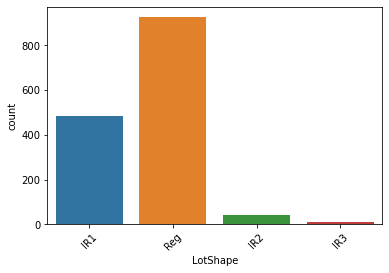

In [114]:
sns.countplot(x=df3['LotShape'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Lvl'), Text(1, 0, 'Bnk'), Text(2, 0, 'HLS'), Text(3, 0, 'Low')])

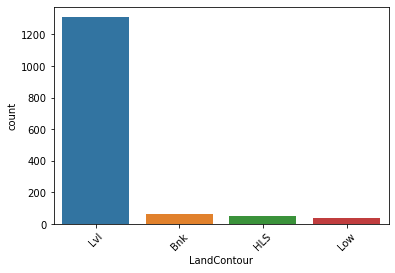

In [115]:
sns.countplot(x=df3['LandContour'])
plt.xticks(rotation = 45)

(array([0, 1]), [Text(0, 0, 'AllPub'), Text(1, 0, 'NoSeWa')])

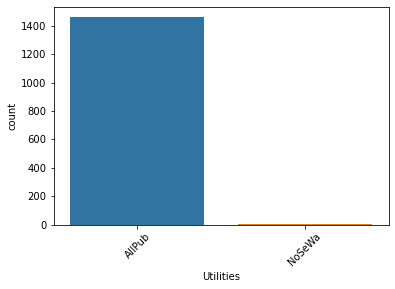

In [116]:
sns.countplot(x=df3['Utilities'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Inside'),
  Text(1, 0, 'CulDSac'),
  Text(2, 0, 'FR2'),
  Text(3, 0, 'Corner'),
  Text(4, 0, 'FR3')])

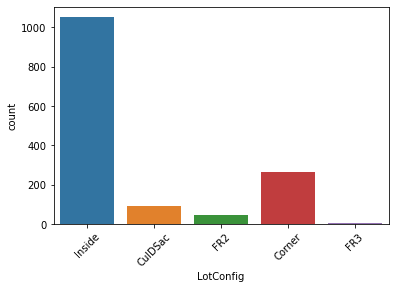

In [117]:
sns.countplot(x=df3['LotConfig'])
plt.xticks(rotation = 45)

(array([0, 1, 2]), [Text(0, 0, 'Gtl'), Text(1, 0, 'Mod'), Text(2, 0, 'Sev')])

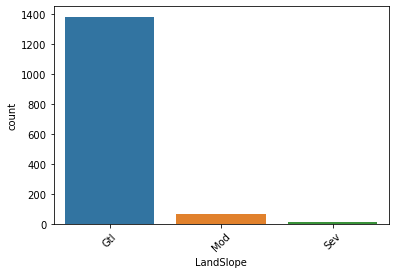

In [118]:
sns.countplot(x=df3['LandSlope'])
plt.xticks(rotation = 45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24]),
 [Text(0, 0, 'NPkVill'),
  Text(1, 0, 'NAmes'),
  Text(2, 0, 'NoRidge'),
  Text(3, 0, 'NWAmes'),
  Text(4, 0, 'Gilbert'),
  Text(5, 0, 'Sawyer'),
  Text(6, 0, 'Edwards'),
  Text(7, 0, 'IDOTRR'),
  Text(8, 0, 'CollgCr'),
  Text(9, 0, 'Mitchel'),
  Text(10, 0, 'Crawfor'),
  Text(11, 0, 'BrDale'),
  Text(12, 0, 'StoneBr'),
  Text(13, 0, 'BrkSide'),
  Text(14, 0, 'NridgHt'),
  Text(15, 0, 'OldTown'),
  Text(16, 0, 'Somerst'),
  Text(17, 0, 'Timber'),
  Text(18, 0, 'SWISU'),
  Text(19, 0, 'SawyerW'),
  Text(20, 0, 'ClearCr'),
  Text(21, 0, 'Veenker'),
  Text(22, 0, 'Blmngtn'),
  Text(23, 0, 'MeadowV'),
  Text(24, 0, 'Blueste')])

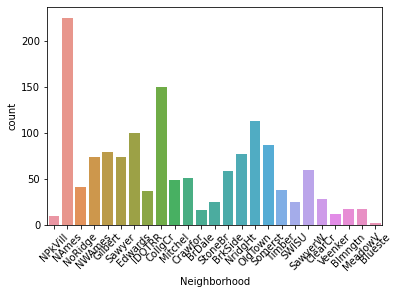

In [119]:
sns.countplot(x=df3['Neighborhood'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Norm'),
  Text(1, 0, 'Feedr'),
  Text(2, 0, 'RRAn'),
  Text(3, 0, 'PosA'),
  Text(4, 0, 'RRAe'),
  Text(5, 0, 'Artery'),
  Text(6, 0, 'PosN'),
  Text(7, 0, 'RRNe'),
  Text(8, 0, 'RRNn')])

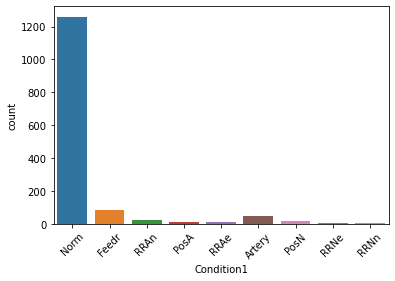

In [120]:
sns.countplot(x=df3['Condition1'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Norm'),
  Text(1, 0, 'RRAe'),
  Text(2, 0, 'Feedr'),
  Text(3, 0, 'PosN'),
  Text(4, 0, 'Artery'),
  Text(5, 0, 'RRNn'),
  Text(6, 0, 'PosA'),
  Text(7, 0, 'RRAn')])

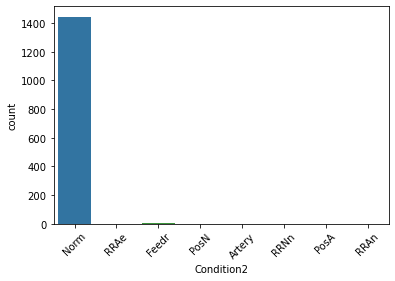

In [121]:
sns.countplot(x=df3['Condition2'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TwnhsE'),
  Text(1, 0, '1Fam'),
  Text(2, 0, 'Duplex'),
  Text(3, 0, 'Twnhs'),
  Text(4, 0, '2fmCon')])

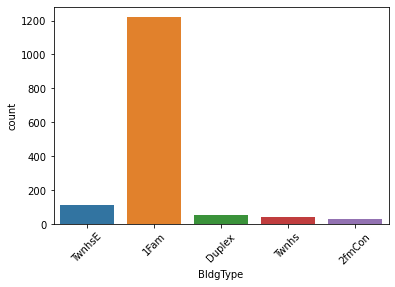

In [122]:
sns.countplot(x=df3['BldgType'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, '1Story'),
  Text(1, 0, '2Story'),
  Text(2, 0, '1.5Fin'),
  Text(3, 0, 'SFoyer'),
  Text(4, 0, '1.5Unf'),
  Text(5, 0, 'SLvl'),
  Text(6, 0, '2.5Fin'),
  Text(7, 0, '2.5Unf')])

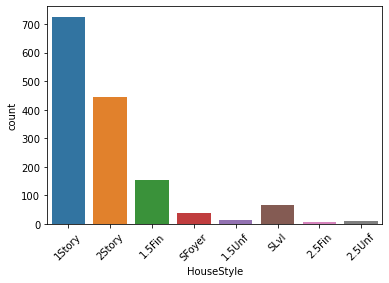

In [123]:
sns.countplot(x=df3['HouseStyle'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Gable'),
  Text(1, 0, 'Flat'),
  Text(2, 0, 'Hip'),
  Text(3, 0, 'Shed'),
  Text(4, 0, 'Gambrel'),
  Text(5, 0, 'Mansard')])

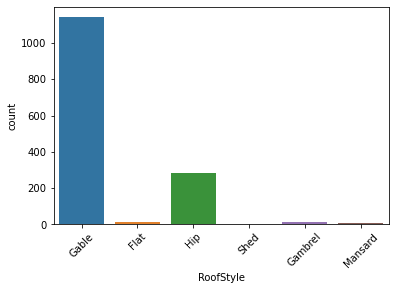

In [124]:
sns.countplot(x=df3['RoofStyle'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'CompShg'),
  Text(1, 0, 'Tar&Grv'),
  Text(2, 0, 'WdShngl'),
  Text(3, 0, 'WdShake'),
  Text(4, 0, 'Roll'),
  Text(5, 0, 'ClyTile'),
  Text(6, 0, 'Metal'),
  Text(7, 0, 'Membran')])

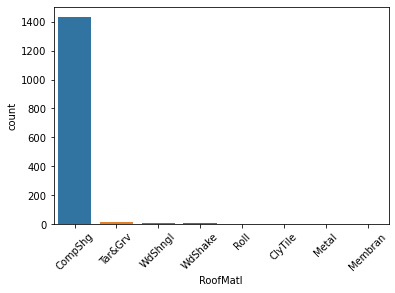

In [125]:
sns.countplot(x=df3['RoofMatl'])
plt.xticks(rotation = 45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Plywood'),
  Text(1, 0, 'Wd Sdng'),
  Text(2, 0, 'MetalSd'),
  Text(3, 0, 'CemntBd'),
  Text(4, 0, 'VinylSd'),
  Text(5, 0, 'HdBoard'),
  Text(6, 0, 'Stucco'),
  Text(7, 0, 'WdShing'),
  Text(8, 0, 'BrkFace'),
  Text(9, 0, 'Stone'),
  Text(10, 0, 'AsbShng'),
  Text(11, 0, 'AsphShn'),
  Text(12, 0, 'ImStucc'),
  Text(13, 0, 'BrkComm'),
  Text(14, 0, 'CBlock')])

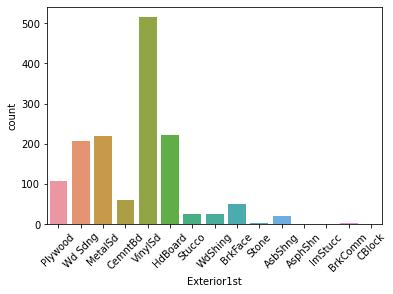

In [126]:
sns.countplot(x=df3['Exterior1st'])
plt.xticks(rotation = 45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'Plywood'),
  Text(1, 0, 'Wd Sdng'),
  Text(2, 0, 'MetalSd'),
  Text(3, 0, 'CmentBd'),
  Text(4, 0, 'VinylSd'),
  Text(5, 0, 'HdBoard'),
  Text(6, 0, 'Wd Shng'),
  Text(7, 0, 'Stucco'),
  Text(8, 0, 'ImStucc'),
  Text(9, 0, 'Stone'),
  Text(10, 0, 'BrkFace'),
  Text(11, 0, 'AsbShng'),
  Text(12, 0, 'Brk Cmn'),
  Text(13, 0, 'AsphShn'),
  Text(14, 0, 'Other'),
  Text(15, 0, 'CBlock')])

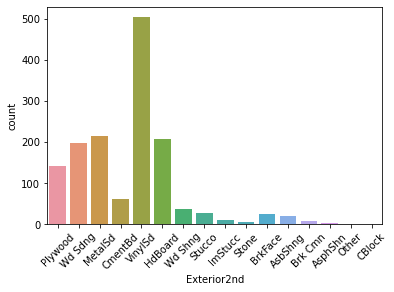

In [127]:
sns.countplot(x=df3['Exterior2nd'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'None'),
  Text(1, 0, 'BrkFace'),
  Text(2, 0, 'Stone'),
  Text(3, 0, 'BrkCmn')])

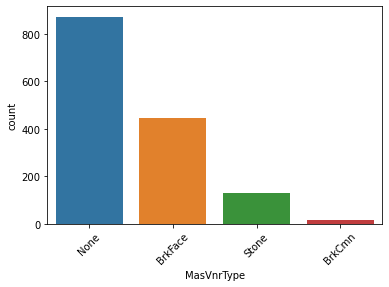

In [137]:
sns.countplot(x=df3['MasVnrType'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'TA'), Text(1, 0, 'Gd'), Text(2, 0, 'Ex'), Text(3, 0, 'Fa')])

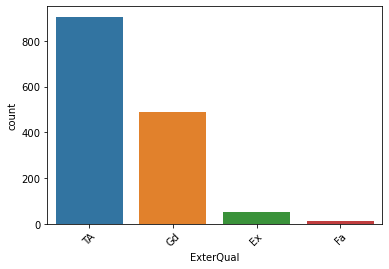

In [138]:
sns.countplot(x=df3['ExterQual'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Gd'),
  Text(2, 0, 'Fa'),
  Text(3, 0, 'Po'),
  Text(4, 0, 'Ex')])

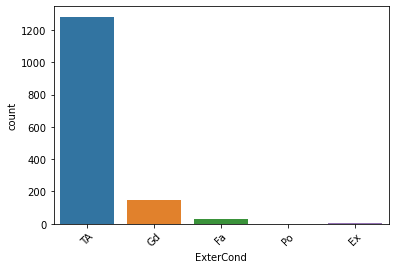

In [139]:
sns.countplot(x=df3['ExterCond'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'CBlock'),
  Text(1, 0, 'PConc'),
  Text(2, 0, 'BrkTil'),
  Text(3, 0, 'Slab'),
  Text(4, 0, 'Stone'),
  Text(5, 0, 'Wood')])

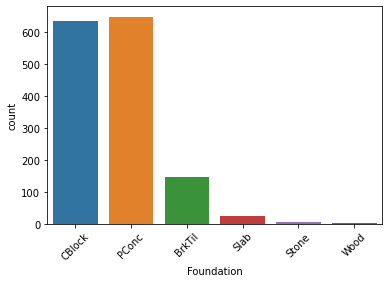

In [140]:
sns.countplot(x=df3['Foundation'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Gd'), Text(1, 0, 'TA'), Text(2, 0, 'Ex'), Text(3, 0, 'Fa')])

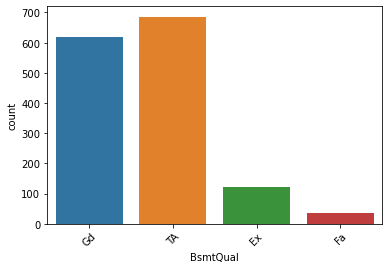

In [141]:
sns.countplot(x=df3['BsmtQual'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'TA'), Text(1, 0, 'Gd'), Text(2, 0, 'Fa'), Text(3, 0, 'Po')])

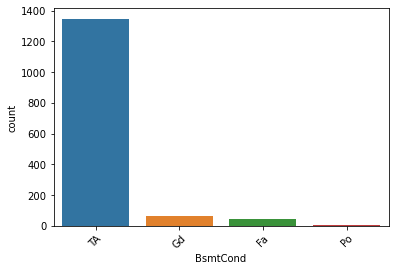

In [142]:
sns.countplot(x=df3['BsmtCond'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'No'), Text(1, 0, 'Gd'), Text(2, 0, 'Av'), Text(3, 0, 'Mn')])

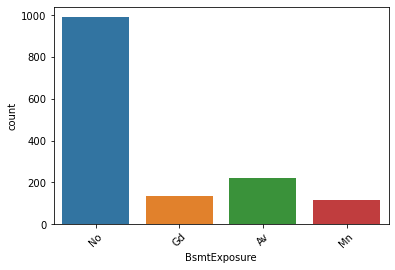

In [143]:
sns.countplot(x=df3['BsmtExposure'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'ALQ'),
  Text(1, 0, 'GLQ'),
  Text(2, 0, 'BLQ'),
  Text(3, 0, 'Unf'),
  Text(4, 0, 'Rec'),
  Text(5, 0, 'LwQ')])

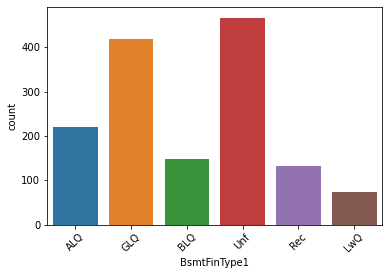

In [144]:
sns.countplot(x=df3['BsmtFinType1'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unf'),
  Text(1, 0, 'Rec'),
  Text(2, 0, 'BLQ'),
  Text(3, 0, 'GLQ'),
  Text(4, 0, 'ALQ'),
  Text(5, 0, 'LwQ')])

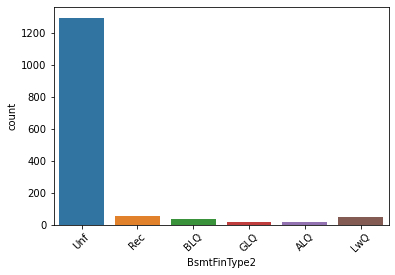

In [145]:
sns.countplot(x=df3['BsmtFinType2'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'GasA'),
  Text(1, 0, 'GasW'),
  Text(2, 0, 'Floor'),
  Text(3, 0, 'OthW'),
  Text(4, 0, 'Wall'),
  Text(5, 0, 'Grav')])

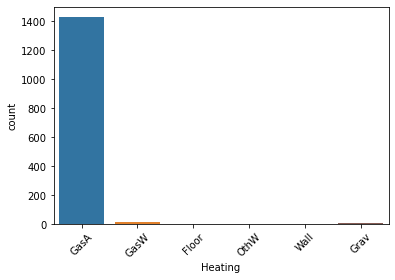

In [146]:
sns.countplot(x=df3['Heating'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Ex'),
  Text(2, 0, 'Gd'),
  Text(3, 0, 'Fa'),
  Text(4, 0, 'Po')])

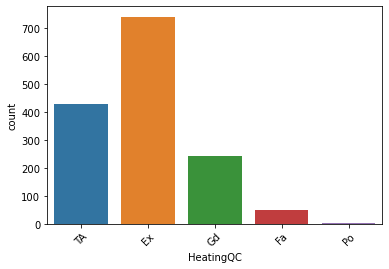

In [147]:
sns.countplot(x=df3['HeatingQC'])
plt.xticks(rotation = 45)

(array([0, 1]), [Text(0, 0, 'Y'), Text(1, 0, 'N')])

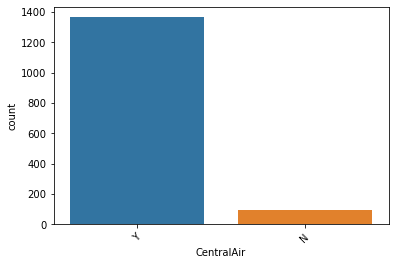

In [148]:
sns.countplot(x=df3['CentralAir'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'SBrkr'),
  Text(1, 0, 'FuseA'),
  Text(2, 0, 'FuseF'),
  Text(3, 0, 'FuseP'),
  Text(4, 0, 'Mix')])

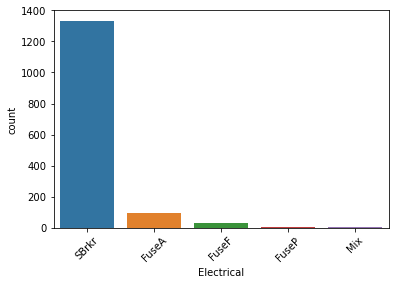

In [149]:
sns.countplot(x=df3['Electrical'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'TA'), Text(1, 0, 'Gd'), Text(2, 0, 'Ex'), Text(3, 0, 'Fa')])

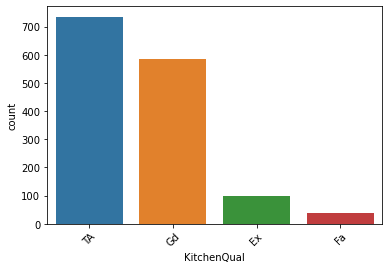

In [150]:
sns.countplot(x=df3['KitchenQual'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Typ'),
  Text(1, 0, 'Mod'),
  Text(2, 0, 'Maj1'),
  Text(3, 0, 'Min1'),
  Text(4, 0, 'Min2'),
  Text(5, 0, 'Sev'),
  Text(6, 0, 'Maj2')])

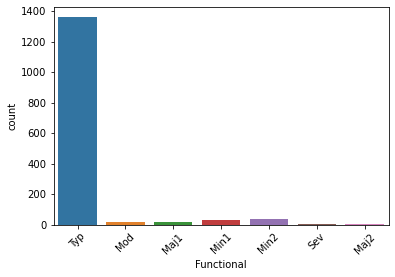

In [151]:
sns.countplot(x=df3['Functional'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Gd'),
  Text(2, 0, 'Fa'),
  Text(3, 0, 'Ex'),
  Text(4, 0, 'Po')])

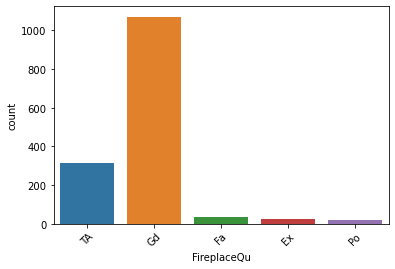

In [152]:
sns.countplot(x=df3['FireplaceQu'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Attchd'),
  Text(1, 0, 'BuiltIn'),
  Text(2, 0, 'Detchd'),
  Text(3, 0, 'Basment'),
  Text(4, 0, '2Types'),
  Text(5, 0, 'CarPort')])

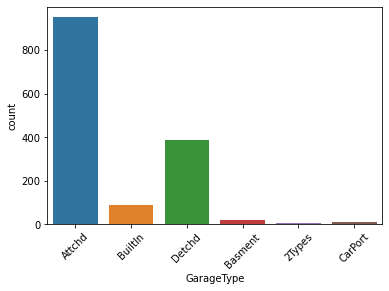

In [153]:
sns.countplot(x=df3['GarageType'])
plt.xticks(rotation = 45)

(array([0, 1, 2]), [Text(0, 0, 'RFn'), Text(1, 0, 'Unf'), Text(2, 0, 'Fin')])

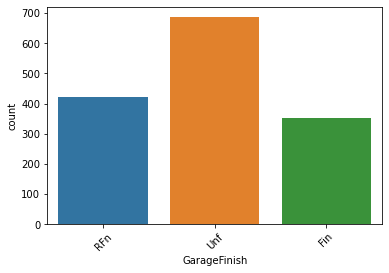

In [154]:
sns.countplot(x=df3['GarageFinish'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Fa'),
  Text(2, 0, 'Gd'),
  Text(3, 0, 'Ex'),
  Text(4, 0, 'Po')])

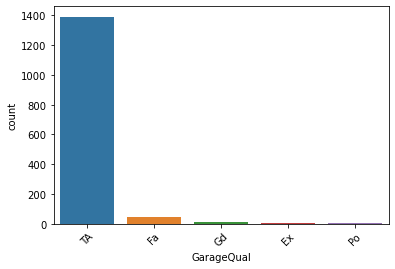

In [155]:
sns.countplot(x=df3['GarageQual'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Fa'),
  Text(2, 0, 'Gd'),
  Text(3, 0, 'Po'),
  Text(4, 0, 'Ex')])

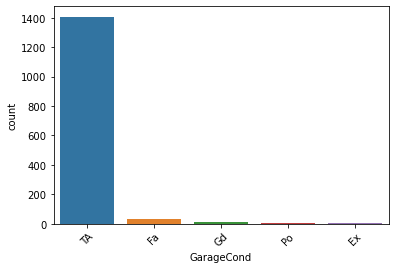

In [156]:
sns.countplot(x=df3['GarageCond'])
plt.xticks(rotation = 45)

(array([0, 1, 2]), [Text(0, 0, 'Y'), Text(1, 0, 'N'), Text(2, 0, 'P')])

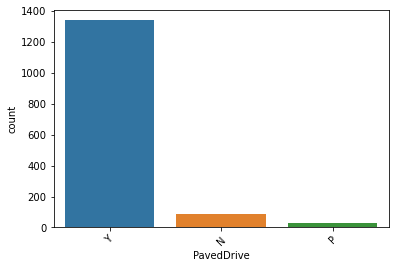

In [157]:
sns.countplot(x=df3['PavedDrive'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'WD'),
  Text(1, 0, 'COD'),
  Text(2, 0, 'New'),
  Text(3, 0, 'ConLI'),
  Text(4, 0, 'ConLw'),
  Text(5, 0, 'Con'),
  Text(6, 0, 'ConLD'),
  Text(7, 0, 'Oth'),
  Text(8, 0, 'CWD')])

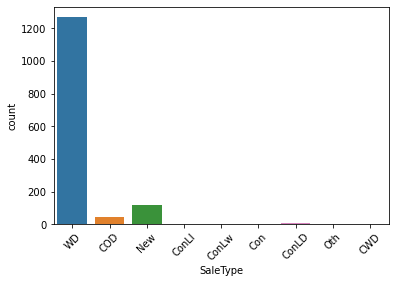

In [158]:
sns.countplot(x=df3['SaleType'])
plt.xticks(rotation = 45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Normal'),
  Text(1, 0, 'Partial'),
  Text(2, 0, 'Abnorml'),
  Text(3, 0, 'Family'),
  Text(4, 0, 'Alloca'),
  Text(5, 0, 'AdjLand')])

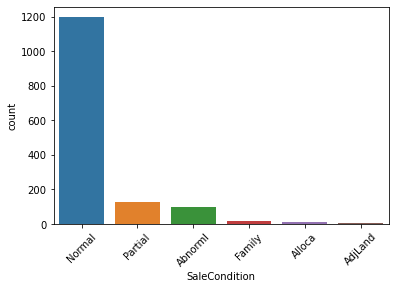

In [159]:
sns.countplot(x=df3['SaleCondition'])
plt.xticks(rotation = 45)

In [348]:
important = ['LotShape','LotConfig','Neighborhood','BldgType','HouseStyle','RoofStyle','Exterior1st','Exterior2nd',
'MasVnrType','ExterQual','Foundation','BsmtQual','BsmtExposure','BsmtFinType1','HeatingQC','KitchenQual','FireplaceQu',
'GarageType','GarageFinish','SaleCondition']

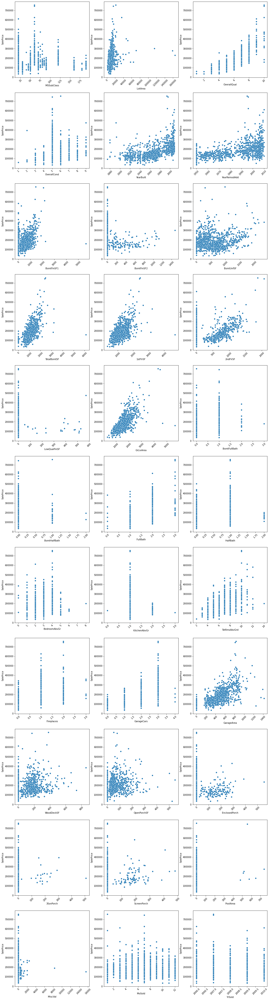

In [72]:
count=1
plt.subplots(figsize=(20, 80))
for i in numerical_features:
    plt.subplot(11,3,count)
    sns.scatterplot(df3[i],df3['SalePrice'])
    plt.xticks(rotation = 45)
    count+=1

plt.show()

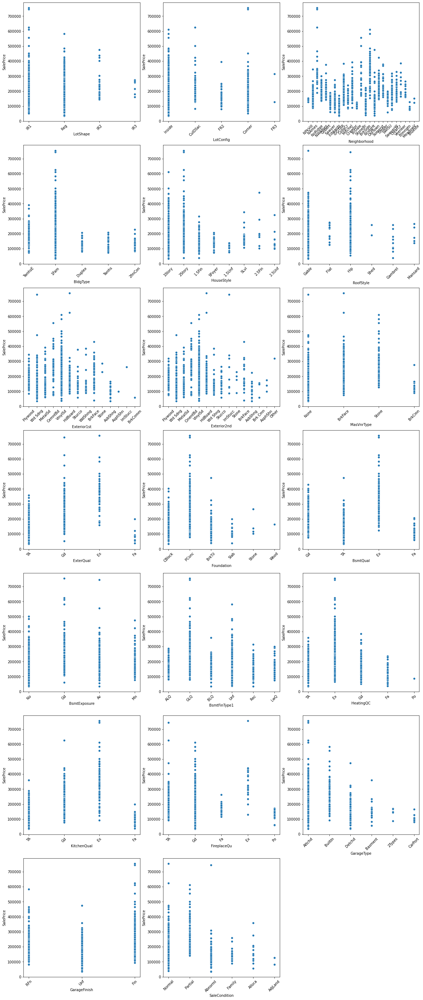

In [161]:
count=1
plt.subplots(figsize=(20, 80))
for i in important:
    plt.subplot(11,3,count)
    sns.scatterplot(df3[i],df3['SalePrice'])
    plt.xticks(rotation = 45)
    count+=1

plt.show()

In [52]:
numerical_features

Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [81]:
categorical_features

Index(['MSZoning', 'LotFrontage', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir',
       'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition',
       'SalePrice'],
      dtype='object')

In [83]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [162]:
priority = ['MSSubClass','HeatingQC','BldgType','LotFrontage','Neighborhood','BsmtFinType1','SaleCondition','TotRmsAbvGrd',
'MSZoning','BedroomAbvGr','OverallCond','GarageArea','YearRemodAdd','1stFlrSF','KitchenQual','FullBath','Fireplaces',
'YearBuilt','BsmtQual','GarageArea','GarageFinish','GrLivArea','ExterQual','OverallQual']

In [168]:
for i in priority:
    print(i,df3[i].dtype)

MSSubClass int64
HeatingQC object
BldgType object
LotFrontage float64
Neighborhood object
BsmtFinType1 object
SaleCondition object
TotRmsAbvGrd int64
MSZoning object
BedroomAbvGr int64
OverallCond int64
GarageArea int64
YearRemodAdd int64
1stFlrSF int64
KitchenQual object
FullBath int64
Fireplaces int64
YearBuilt int64
BsmtQual object
GarageArea int64
GarageFinish object
GrLivArea int64
ExterQual object
OverallQual int64


<AxesSubplot:xlabel='HeatingQC', ylabel='SalePrice'>

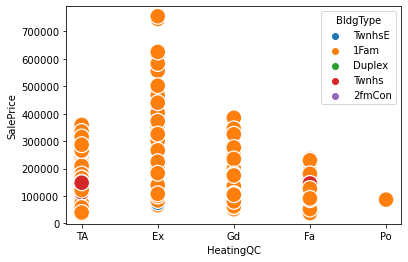

In [187]:
sns.scatterplot(x=df3['HeatingQC'],y=df3['SalePrice'],hue=df3['BldgType'],s=250)

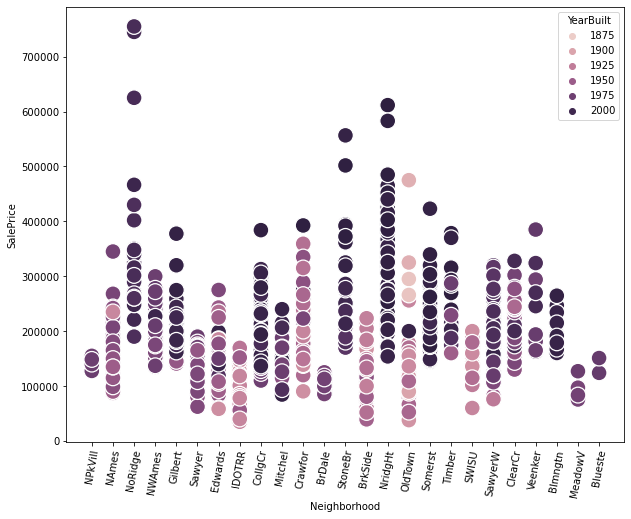

In [326]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['Neighborhood'],y=df3['SalePrice'],hue=df3['YearBuilt'],s=250)
plt.xticks(rotation=80)
plt.show()

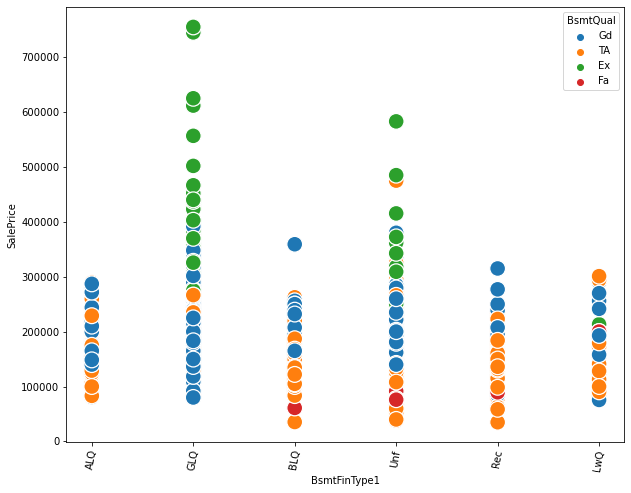

In [185]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['BsmtFinType1'],y=df3['SalePrice'],hue=df3['BsmtQual'],s=250)
plt.xticks(rotation=80)
plt.show()

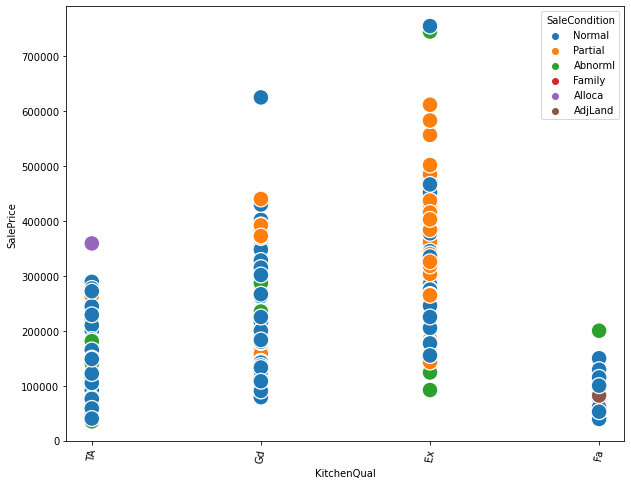

In [327]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['KitchenQual'],y=df3['SalePrice'],hue=df3['SaleCondition'],s=250)
plt.xticks(rotation=80)
plt.show()

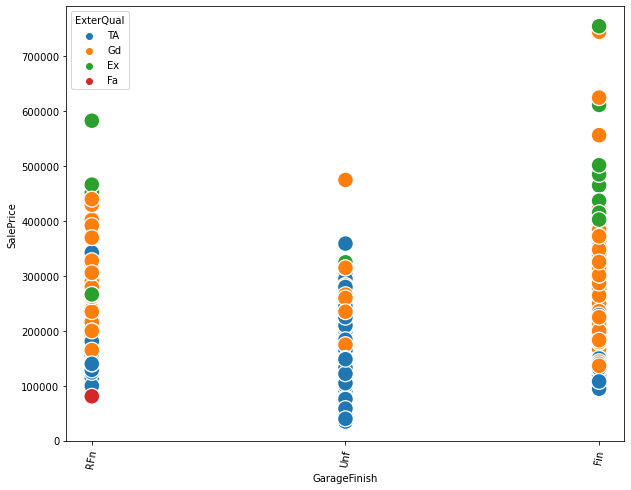

In [190]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['GarageFinish'],y=df3['SalePrice'],hue=df3['ExterQual'],s=250)
plt.xticks(rotation=80)
plt.show()

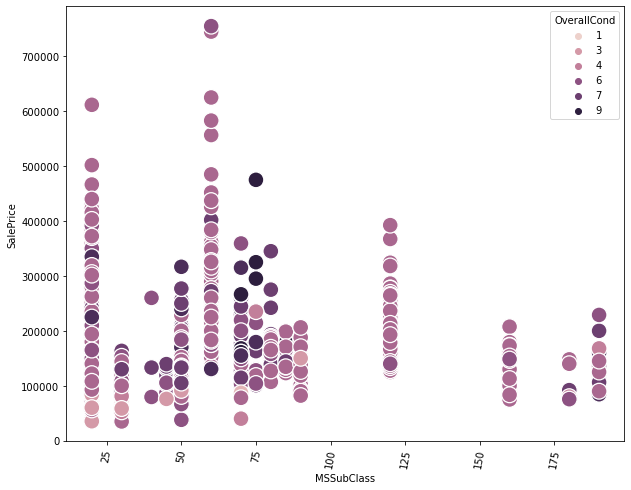

In [193]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['MSSubClass'],y=df3['SalePrice'],hue=df3['OverallCond'],s=250)
plt.xticks(rotation=80)
plt.show()

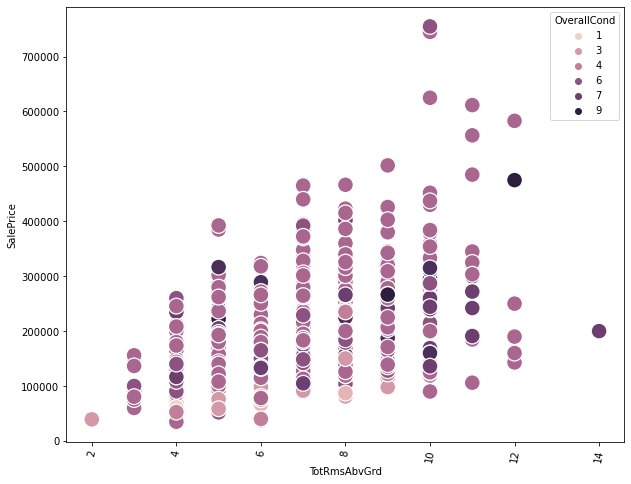

In [194]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['TotRmsAbvGrd'],y=df3['SalePrice'],hue=df3['OverallCond'],s=250)
plt.xticks(rotation=80)
plt.show()

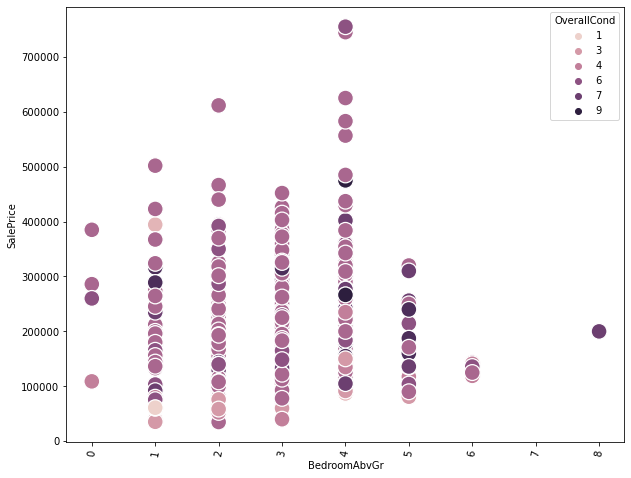

In [195]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['BedroomAbvGr'],y=df3['SalePrice'],hue=df3['OverallCond'],s=250)
plt.xticks(rotation=80)
plt.show()

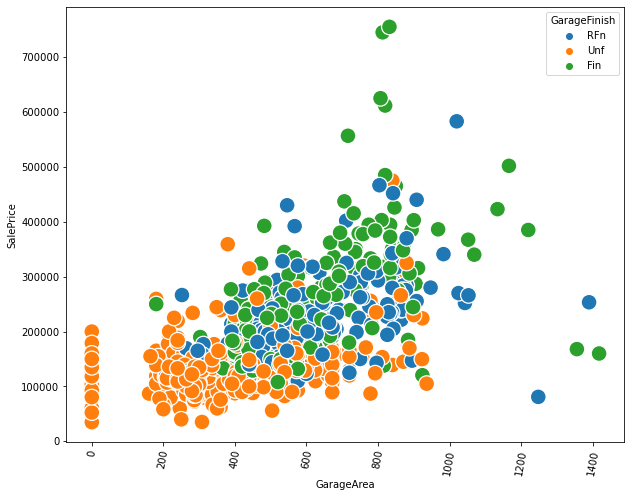

In [196]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['GarageArea'],y=df3['SalePrice'],hue=df3['GarageFinish'],s=250)
plt.xticks(rotation=80)
plt.show()

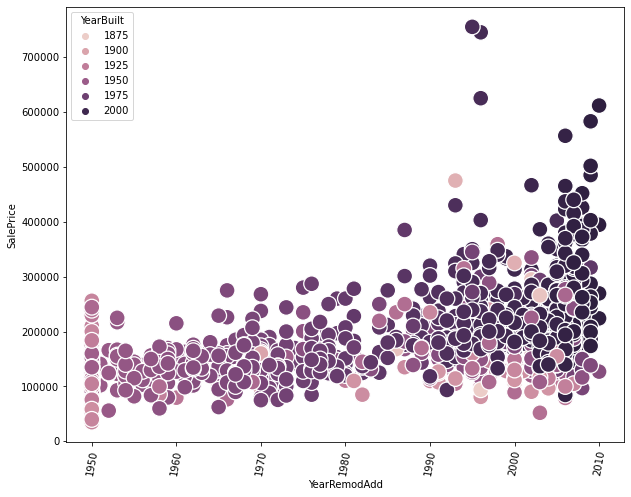

In [197]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['YearRemodAdd'],y=df3['SalePrice'],hue=df3['YearBuilt'],s=250)
plt.xticks(rotation=80)
plt.show()

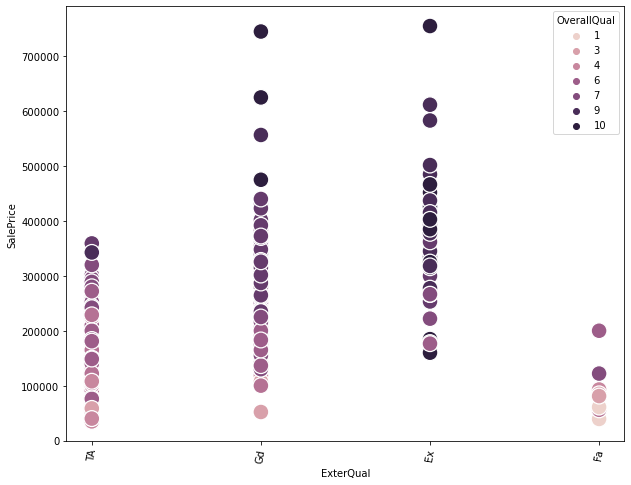

In [198]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['ExterQual'],y=df3['SalePrice'],hue=df3['OverallQual'],s=250)
plt.xticks(rotation=80)
plt.show()

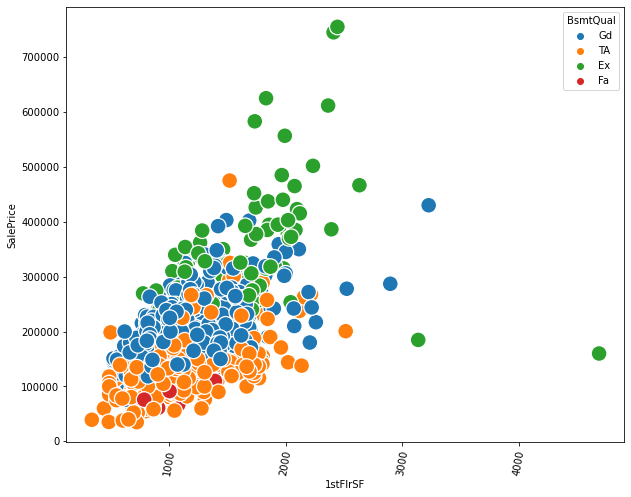

In [199]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['1stFlrSF'],y=df3['SalePrice'],hue=df3['BsmtQual'],s=250)
plt.xticks(rotation=80)
plt.show()

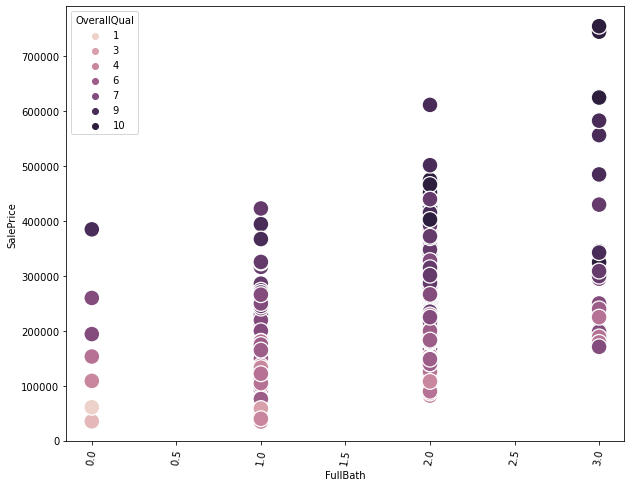

In [200]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['FullBath'],y=df3['SalePrice'],hue=df3['OverallQual'],s=250)
plt.xticks(rotation=80)
plt.show()

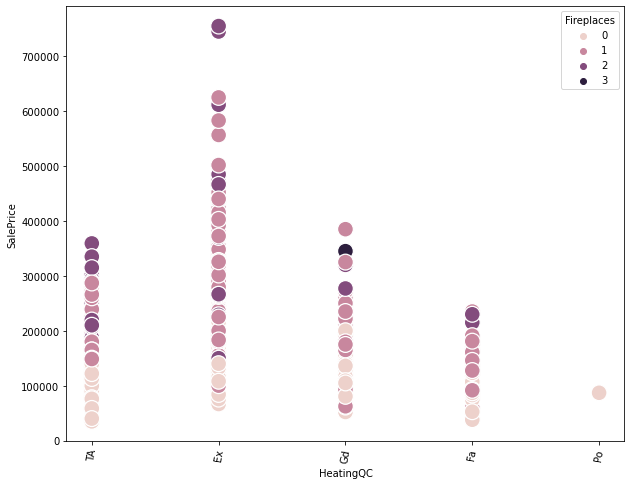

In [201]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=df3['HeatingQC'],y=df3['SalePrice'],hue=df3['Fireplaces'],s=250)
plt.xticks(rotation=80)
plt.show()

In [169]:
Pri_object = ['HeatingQC','BldgType','Neighborhood','BsmtFinType1','SaleCondition','MSZoning','MSZoning','KitchenQual',
             'BsmtQual','GarageFinish','ExterQual']

In [191]:
Pri_num = ['MSSubClass','TotRmsAbvGrd','BedroomAbvGr','OverallCond','GarageArea','YearRemodAdd','1stFlrSF','FullBath',
'Fireplaces','YearBuilt','GarageArea','GrLivArea','OverallQual']

In [360]:
lab = LabelEncoder()
for i in Columns:
    df3[i] = lab.fit_transform(df3[i])

print(df3.dtypes)

MSSubClass       int64
MSZoning         int32
LotFrontage      int64
LotArea          int64
Street           int32
LotShape         int64
LandContour      int64
Utilities        int64
LotConfig        int64
LandSlope        int64
Neighborhood     int64
Condition1       int64
Condition2       int64
BldgType         int64
HouseStyle       int64
OverallQual      int64
OverallCond      int64
YearBuilt        int64
YearRemodAdd     int64
RoofStyle        int64
RoofMatl         int64
Exterior1st      int64
Exterior2nd      int64
MasVnrType       int64
MasVnrArea       int64
ExterQual        int64
ExterCond        int64
Foundation       int64
BsmtQual         int64
BsmtCond         int64
BsmtExposure     int64
BsmtFinType1     int64
BsmtFinSF1       int64
BsmtFinType2     int64
BsmtFinSF2       int64
BsmtUnfSF        int64
TotalBsmtSF      int64
Heating          int64
HeatingQC        int64
CentralAir       int64
Electrical       int64
1stFlrSF         int64
2ndFlrSF         int64
LowQualFinS

In [361]:
df3.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.037785,-0.332077,-0.298528,-0.025737,0.090920,-0.007658,-0.026217,0.060625,-0.029300,-0.008765,-0.023826,-0.026699,0.712474,0.446294,0.056546,-0.060795,0.041336,0.039944,-0.131687,-0.021525,-0.081155,-0.121192,-0.048055,0.027877,-0.019969,0.007819,0.072182,-0.044970,-0.014816,-0.092154,0.038277,-0.072985,0.044509,-0.074354,-0.135334,-0.262705,0.062597,0.021791,-0.096907,0.056742,-0.229439,0.305202,0.052697,0.137979,0.001790,0.013119,0.166707,0.208262,0.024467,0.323390,0.008222,0.106714,0.020999,-0.019405,0.053777,0.086128,0.086072,-0.006408,-0.009126,-0.068665,0.006409,0.000962,-0.048433,-0.015481,0.000819,-0.005201,-0.047292,-0.017565,0.017759,-0.012910,0.007052,-0.022100,0.020195,-0.033097,-0.009587
MSZoning,0.037785,1.000000,-0.117522,-0.080135,0.087654,0.061887,-0.017854,-0.001192,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.306481,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.028279,-0.043360,0.200536,-0.096041,-0.235174,0.128245,-0.010528,0.037209,0.024688,-0.058023,-0.031718,0.032360,-0.039444,-0.100984,0.056866,0.134279,-0.049523,-0.070818,-0.060895,-0.079610,0.005452,-0.104200,-0.018526,0.007193,-0.198290,-0.133876,-0.015176,0.049434,0.128976,-0.042591,-0.095722,-0.011349,-0.009943,0.116007,-0.265650,0.167501,-0.157042,-0.195628,-0.150802,-0.083272,-0.100366,-0.015226,-0.166268,0.112593,-0.000527,0.014073,-0.002825,0.018630,-0.031496,-0.020628,0.097437,0.009494,-0.095719
LotFrontage,-0.332077,-0.117522,1.000000,0.573462,-0.043002,-0.154484,-0.032146,0.001029,-0.189238,0.049899,0.101682,-0.005284,0.002220,-0.442460,0.047395,0.242254,-0.061594,0.136853,0.078245,0.169993,0.067276,0.062384,0.087157,-0.047661,0.200962,-0.185592,0.053969,0.104856,-0.170615,0.063070,-0.125150,-0.028288,0.142267,-0.034244,0.052042,0.121639,0.337768,-0.030881,-0.069896,0.081347,0.070038,0.374498,0.138530,0.033156,0.332191,0.072652,-0.007250,0.191445,0.062132,0.258624,-0.004260,-0.184949,0.328386,0.030224,0.234781,0.077091,-0.241317,0.073171,-0.224234,0.300184,0.341163,0.058312,0.048745,0.105251,0.102587,0.143815,-0.003822,0.069661,0.050425,0.068069,0.005867,0.012533,0.007927,-0.035355,0.062591,0.176858
LotArea,-0.298528,-0.080135,0.573462,1.000000,-0.058066,-0.308136,-0.038541,0.038049,-0.199341,0.148648,0.103481,0.085628,0.027459,-0.442006,0.057465,0.259931,-0.036993,0.111608,0.086860,0.151133,0.152856,0.064124,0.065273,-0.052578,0.198695,-0.162774,0.033172,0.059866,-0.168667,0.008706,-0.165447,-0.049793,0.204304,-0.053305,0.080386,0.080988,0.375820,-0.032015,-0.063844,0.107579,0.073700,0.447255,0.196752,0.014743,0.454594,0.105684,0.040318,0.240839,0.140117,0.291693,-0.030246,-0.166742,0.407320,-0.016864,0.362051,0.115151,-0.227236,0.050874,-0.208063,0.340565,0.369772,0.043870,0.035375,0.072322,0.217749,0.165089,-0.028769,0.074834,0.110007,0.068781,0.062162,-0.002017,-0.031183,-0.021014,0.062024,0.275276
Street,-0.025737,0.087654,-0.043002,-0.058066,1.000000,-0.010224,0.115995,0.001682,0.013960,-0.179360,-0.011561,-0.071657,0.002039,-0.018243,0.023704,0.058823,0.042848,0.022960,0.065465,-0.019732,0.008081,0.002505,0.006166,0.010007,0.016844,0.049976,0.005874,0.03527

<AxesSubplot:>

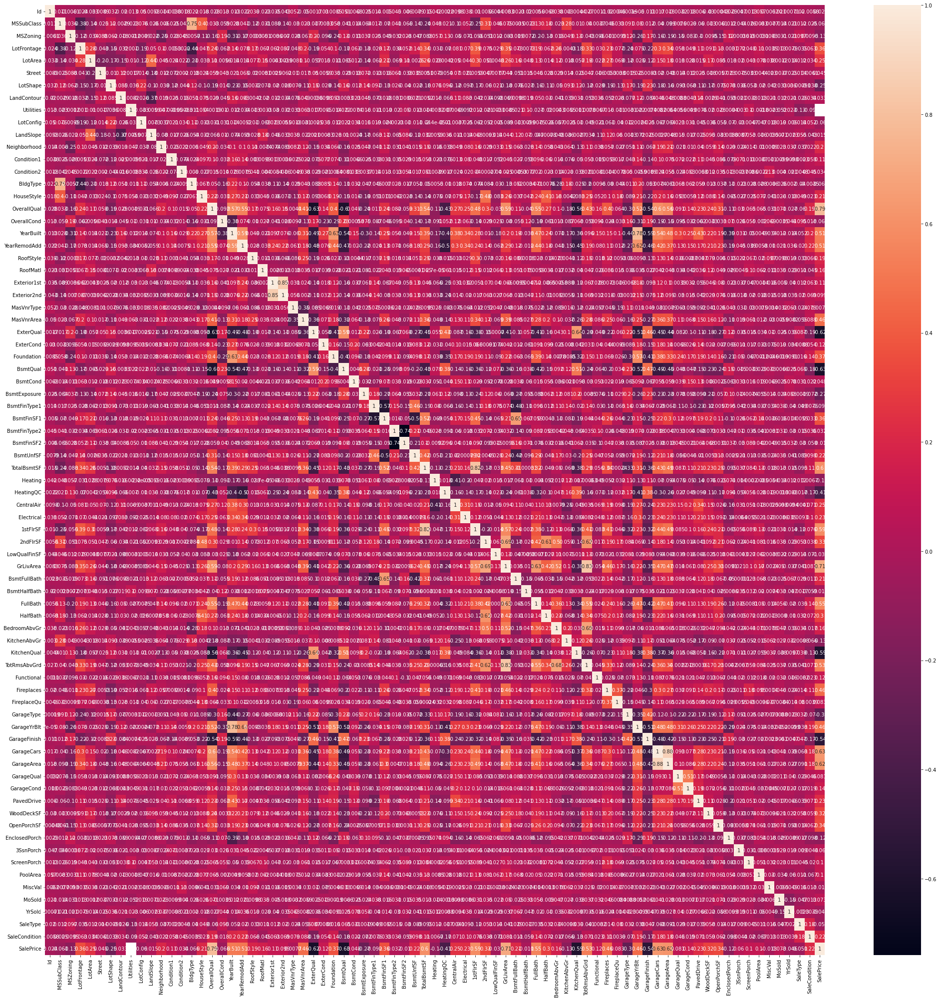

In [70]:
plt.figure(figsize=(35,35))
sns.heatmap(df3.corr(),annot=True)

In [71]:
df3.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

In [355]:
Columns = [ 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SaleType',
       'SaleCondition', 'SalePrice']

In [362]:
for i in Columns:
    Q1,Q3 = np.percentile(df3[i] , [25,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    df_no_outliers = df3[(df3[i] < lower_range) | (df3[i] > upper_range)]

In [363]:
df_no_outliers.shape

(0, 76)

In [364]:
z = np.abs(zscore(df3))
threshold = 3
print(np.where(z<3))
print(df3.shape)

(array([   0,    0,    0, ..., 1459, 1459, 1459], dtype=int64), array([ 0,  1,  2, ..., 73, 74, 75], dtype=int64))
(1460, 76)


In [365]:
df_new = df3[(z<3).all(axis = 1)]
df_new.shape

(617, 76)

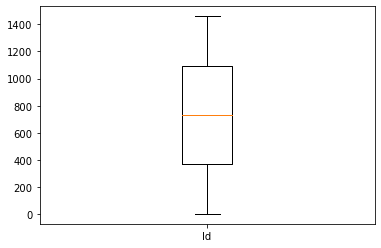

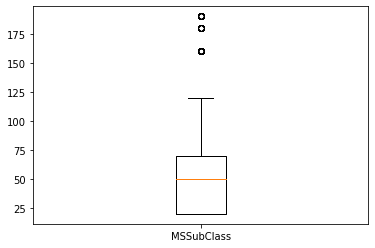

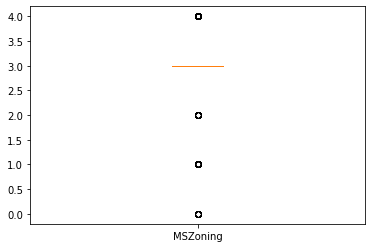

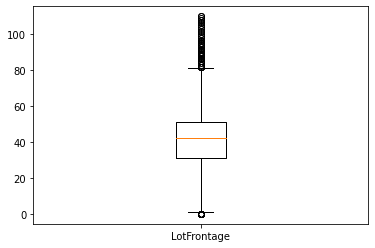

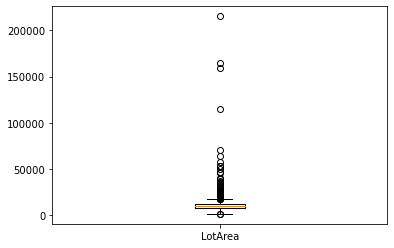

...

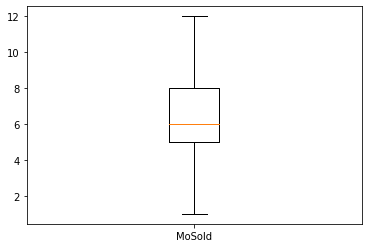

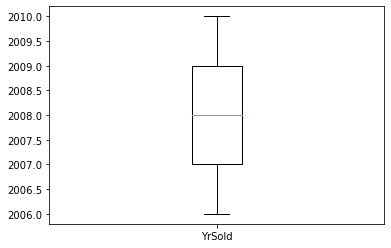

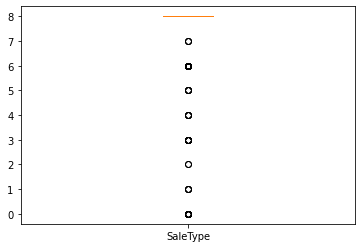

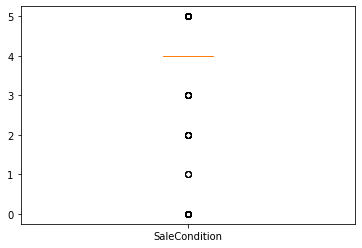

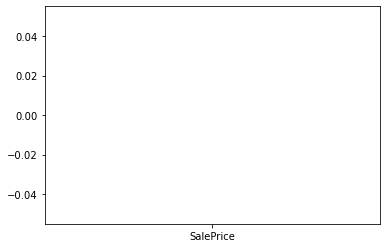

In [80]:
for i in Columns:
    plt.boxplot(df3[i], labels = [i])
    plt.show()

In [81]:
df3.skew()

Id               0.000000 
MSSubClass       1.407657 
MSZoning        -1.735395 
LotFrontage      0.449513 
LotArea          12.207688
Street          -15.518770
LotShape        -0.610175 
LandContour     -3.162499 
Utilities        38.209946
LotConfig       -1.135632 
LandSlope        4.813682 
Neighborhood     0.042122 
Condition1       3.019196 
Condition2       13.171844
BldgType         2.245648 
HouseStyle       0.306755 
OverallQual      0.216944 
OverallCond      0.693067 
YearBuilt       -0.613461 
YearRemodAdd    -0.503562 
RoofStyle        1.473796 
RoofMatl         8.109402 
Exterior1st     -0.726314 
Exterior2nd     -0.692963 
MasVnrType      -0.073627 
MasVnrArea       2.676412 
ExterQual       -1.830265 
ExterCond       -2.565305 
Foundation       0.091217 
BsmtQual        -1.344288 
BsmtCond        -3.456505 
BsmtExposure    -1.189376 
BsmtFinType1    -0.061029 
BsmtFinSF1       1.685503 
BsmtFinType2    -3.629144 
BsmtFinSF2       4.255261 
BsmtUnfSF        0.920268 
T

In [83]:
for i in Columns :
    if df3.skew().loc[i]>0.60:
        df3[i] = np.log1p(df3[i])

In [84]:
df3.skew()

Id               0.000000 
MSSubClass       0.248997 
MSZoning        -1.735395 
LotFrontage      0.449513 
LotArea         -0.137404 
Street          -15.518770
LotShape        -0.610175 
LandContour     -3.162499 
Utilities        38.209946
LotConfig       -1.135632 
LandSlope        4.297167 
Neighborhood     0.042122 
Condition1      -1.031847 
Condition2       0.129311 
BldgType         2.023472 
HouseStyle       0.306755 
OverallQual      0.216944 
OverallCond     -0.254015 
YearBuilt       -0.613461 
YearRemodAdd    -0.503562 
RoofStyle        1.181380 
RoofMatl         7.548284 
Exterior1st     -0.726314 
Exterior2nd     -0.692963 
MasVnrType      -0.073627 
MasVnrArea       0.481120 
ExterQual       -1.830265 
ExterCond       -2.565305 
Foundation       0.091217 
BsmtQual        -1.344288 
BsmtCond        -3.456505 
BsmtExposure    -1.189376 
BsmtFinType1    -0.061029 
BsmtFinSF1      -0.618410 
BsmtFinType2    -3.629144 
BsmtFinSF2       2.523694 
BsmtUnfSF       -2.186504 
T

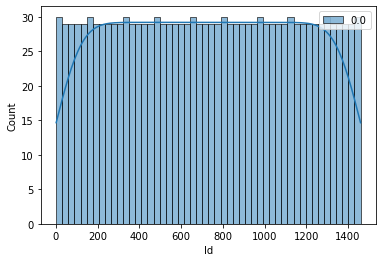

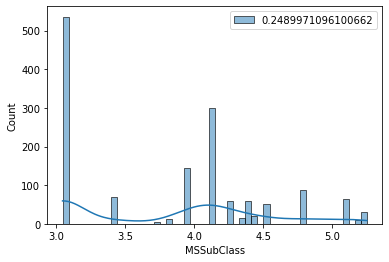

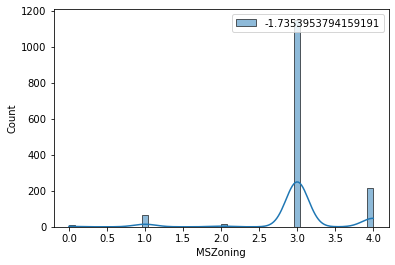

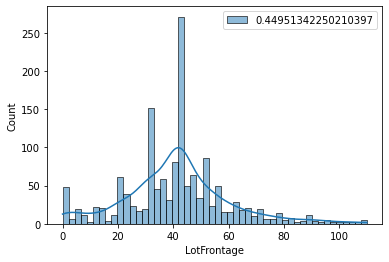

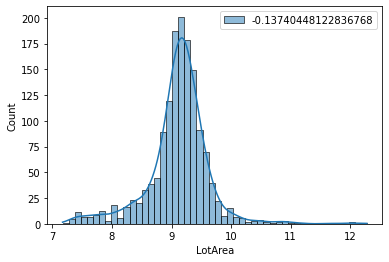

...

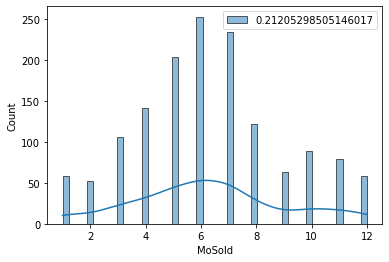

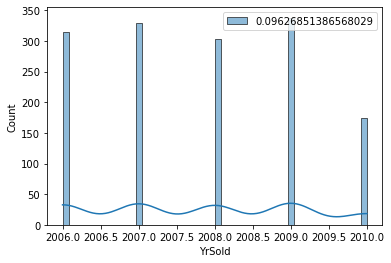

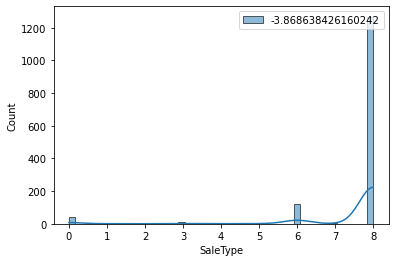

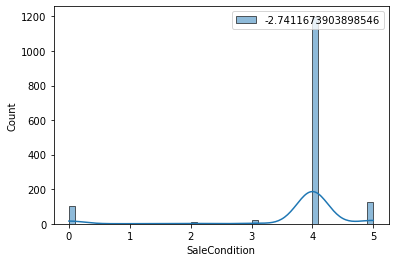

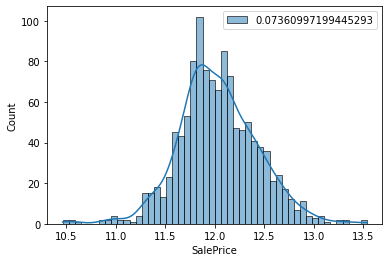

In [86]:
for i in Columns:
    sns.histplot(df3[i], kde = True, bins = 50, label = df3[i].skew())
    plt.legend(loc = 'upper right')
    plt.show()

In [366]:
X = df3.drop(['SalePrice'],axis=1).iloc[:1168]
y = df3['SalePrice'].iloc[:1168]

In [367]:
from sklearn.preprocessing import StandardScaler

In [368]:
for i in X.columns:
    scaler = StandardScaler()
    X[i] = scaler.fit_transform(X[i].values.reshape(-1, 1))

In [412]:
reg_model = [LinearRegression(),GradientBoostingRegressor(),AdaBoostRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),ExtraTreesRegressor(),RandomForestRegressor()]
max_r2_score = 0
for r_state in range(42,95):
    X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = r_state,test_size = 0.33)
    for i in reg_model:
        i.fit(X_train,y_train)
        pred = i.predict(X_test)
        r2_scores = r2_score(y_test,pred)
        print("R2 score for the random state is" ,r_state ,"is", r2_scores)
        if r2_scores > max_r2_score:
            max_r2_score = r2_scores
            final_state = r_state
            final_model = i
print()
print()
print()
print()
print("Maximum R2 score in the random state " ,final_state , "is" , max_r2_score ,"and model is",final_model)

R2 score for the random state is 42 is 0.893764743047283
R2 score for the random state is 42 is 0.9025030240287683
R2 score for the random state is 42 is 0.8480294738923583
R2 score for the random state is 42 is 0.749322693332322
R2 score for the random state is 42 is 0.8078346188293687
R2 score for the random state is 42 is 0.8858359681412976
R2 score for the random state is 42 is 0.8724498810310303
R2 score for the random state is 43 is 0.8846504495168522
R2 score for the random state is 43 is 0.9113700683250061
R2 score for the random state is 43 is 0.8551946742837997
R2 score for the random state is 43 is 0.7182151884569721
R2 score for the random state is 43 is 0.805129928731849
R2 score for the random state is 43 is 0.8935842351942374
R2 score for the random state is 43 is 0.8952229221372062
R2 score for the random state is 44 is 0.9088796270733802
R2 score for the random state is 44 is 0.9030778405122836
R2 score for the random state is 44 is 0.8597837439392151
R2 score for the 

R2 score for the random state is 62 is 0.8506257740510585
R2 score for the random state is 62 is 0.7989415922138559
R2 score for the random state is 62 is 0.8471432660782722
R2 score for the random state is 62 is 0.8949600904983837
R2 score for the random state is 62 is 0.8821617819960615
R2 score for the random state is 63 is 0.9107703341130944
R2 score for the random state is 63 is 0.9077265678890422
R2 score for the random state is 63 is 0.8413563986045651
R2 score for the random state is 63 is 0.7238998029104466
R2 score for the random state is 63 is 0.7998209506468951
R2 score for the random state is 63 is 0.9082029436228908
R2 score for the random state is 63 is 0.8955119658070527
R2 score for the random state is 64 is 0.8431479904296288
R2 score for the random state is 64 is 0.8706013735075748
R2 score for the random state is 64 is 0.8422099719395647
R2 score for the random state is 64 is 0.7063676865194346
R2 score for the random state is 64 is 0.7925851243865643
R2 score for t

R2 score for the random state is 82 is 0.8866625083150674
R2 score for the random state is 82 is 0.8733959161645464
R2 score for the random state is 83 is 0.8622764413597835
R2 score for the random state is 83 is 0.8929215501810163
R2 score for the random state is 83 is 0.845005417388454
R2 score for the random state is 83 is 0.7670413009849646
R2 score for the random state is 83 is 0.8162231297744427
R2 score for the random state is 83 is 0.8843866971941602
R2 score for the random state is 83 is 0.8787837139731364
R2 score for the random state is 84 is 0.9247027018264754
R2 score for the random state is 84 is 0.9216578069009181
R2 score for the random state is 84 is 0.8630946121570078
R2 score for the random state is 84 is 0.7585205442751258
R2 score for the random state is 84 is 0.8261433464009642
R2 score for the random state is 84 is 0.9182633341390221
R2 score for the random state is 84 is 0.9009352020758935
R2 score for the random state is 85 is 0.903888339183914
R2 score for the

In [370]:
LR = LinearRegression()
LR.fit(X_train,y_train)
pred = LR.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 89.19152177153504


In [371]:
print('Mean Absolute Error: ', mean_absolute_error(y_test,pred))
print('Mean squared Error: ', mean_squared_error(y_test,pred))
print('Root Mean Absolute Error: ', np.sqrt(mean_absolute_error(y_test,pred)))

Mean Absolute Error:  34.291056610243736
Mean squared Error:  2578.755601384853
Root Mean Absolute Error:  5.855856607725614


Text(0, 0.5, 'Predicted_Y')

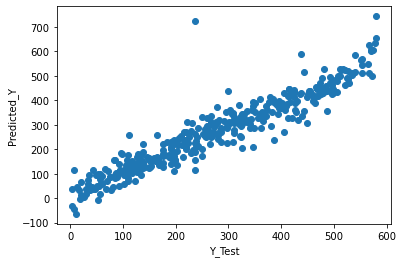

In [372]:
plt.scatter(x=y_test,y=pred)
plt.xlabel('Y_Test')
plt.ylabel('Predicted_Y')

### Feature Importance

In [373]:
ETR = ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred = ETR.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 90.03806623518939


<AxesSubplot:>

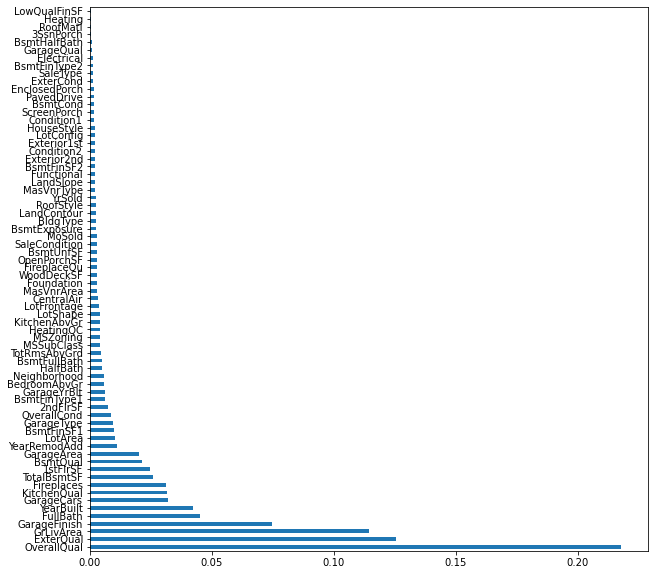

In [374]:
plt.figure(figsize=(10,10))
feat_importances = pd.Series(ETR.feature_importances_, index=X_train.columns)
feat_importances.nlargest(70).plot(kind='barh')

### Pipeline

### Pipeline with 20 features

In [375]:
from sklearn.pipeline import Pipeline,make_pipeline
pipeline_lr=Pipeline([('scalar1',StandardScaler()),
                     ('pca1',PCA(n_components=20)),
                     ('lr_regressor',LinearRegression())])

In [377]:
pipeline_dt=Pipeline([('scalar2',StandardScaler()),
                     ('pca2',PCA(n_components=20)),
                     ('rf_regressor',RandomForestRegressor())])

In [378]:
pipelines = [pipeline_lr, pipeline_dt]

In [379]:
best_accuracy=0.0
best_classifier=0
best_pipeline=""

In [380]:
pipe_dict = {0: 'Linear Regression',1:'RandomForest'}

for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [381]:
pred = pipe.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 86.85245474287953


### Pipeline with 10 features

In [382]:
from sklearn.pipeline import Pipeline,make_pipeline
pipeline_lr=Pipeline([('scalar1',StandardScaler()),
                     ('pca1',PCA(n_components=10)),
                     ('lr_regressor',LinearRegression())])

In [383]:
pipeline_dt=Pipeline([('scalar2',StandardScaler()),
                     ('pca2',PCA(n_components=10)),
                     ('rf_regressor',RandomForestRegressor())])

In [384]:
pipelines = [pipeline_lr, pipeline_dt]

In [385]:
best_accuracy=0.0
best_classifier=0
best_pipeline=""

In [386]:
pipe_dict = {0: 'Linear Regression',1:'RandomForest'}

for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [387]:
pred = pipe.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 87.38874715057197


In [388]:
pipe.steps

[('scalar2', StandardScaler()),
 ('pca2', PCA(n_components=10)),
 ('rf_regressor', RandomForestRegressor())]

### Pipeline for 5 features

In [389]:
from sklearn.pipeline import Pipeline,make_pipeline
pipeline_lr=Pipeline([('scalar1',StandardScaler()),
                     ('pca1',PCA(n_components=5)),
                     ('lr_regressor',LinearRegression())])

In [390]:
pipeline_dt=Pipeline([('scalar2',StandardScaler()),
                     ('pca2',PCA(n_components=5)),
                     ('rf_regressor',RandomForestRegressor())])

In [391]:
pipelines = [pipeline_lr, pipeline_dt]

In [392]:
best_accuracy=0.0
best_classifier=0
best_pipeline=""

In [393]:
pipe_dict = {0: 'Linear Regression',1:'RandomForest'}

for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [394]:
pred = pipe.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 87.46100678612534


### Test Data Prediction

In [395]:
tes = df3.iloc[1168:]

In [396]:
test_da = tes.drop(['SalePrice'],axis=1)

In [397]:
for i in test_da.columns:
    scaler = StandardScaler()
    test_da[i] = scaler.fit_transform(test_da[i].values.reshape(-1, 1))

In [398]:
test_da.shape

(292, 75)

In [403]:
ETR = ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred = ETR.predict(test_da)


In [404]:
pred.shape

(292,)

In [405]:
SalePrice = pd.DataFrame(pred).reset_index()

In [406]:
Test = pd.DataFrame(test_da).reset_index()

In [408]:
Sale_Price = pd.concat([Test,SalePrice],axis=1)
Sale_Price

,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,index,0
0,1168,-0.980984,-0.142702,1.016773,1.406597,0.083045,-1.402669,-2.566101,-0.058621,-2.001106,-0.226274,1.552004,-0.032019,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.098331,1.031595,1.846195,-0.082534,0.738004,0.745726,1.952161,0.717433,-0.857858,0.343557,0.776109,-2.549340,0.227757,-1.192678,-0.410373,1.812583,0.296045,-0.311929,0.453795,1.874792,-0.141879,-0.834476,0.248633,0.315635,1.841273,-0.704459,-0.095292,1.115494,1.132656,-0.263813,0.776457,-0.727992,0.254952,-0.217895,-0.469314,0.917136,0.234764,0.651586,-0.429570,-0.659455,1.106508,-1.474589,1.687009,1.232832,0.216962,0.181711,0.281378,0.821326,0.069769,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.276960,-0.650908,0.242421,0.211151,0,517.16
1,1169,1.608104,-0.142702,0.178819,-1.134788,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.552004,-0.032019,-0.058621,2.722077,-0.518671,1.419117,-0.464603,0.367937,-0.064496,-0.523427,-0.082534,-1.186077,-1.265177,0.355435,-0.678669,-0.857858,0.343557,-0.518884,-0.303768,0.227757,-2.090260,-0.410373,1.514568,0.296045,-0.311929,-1.048628,0.578663,-0.141879,0.345510,0.248633,0.315635,0.790986,-0.704459,-0.095292,-0.223882,1.132656,-0.263813,-1.051974,-0.727992,-2.226584,-0.217895,-0.469314,-1.401511,0.234764,0.651586,-2.710193,-0.659455,0.199651,-0.254816,0.359228,0.615374,0.216962,0.181711,0.281378,-0.356551,-0.746805,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.637997,0.863555,-6.266715,-3.583077,1,390.69
2,1170,-0.980984,-0.142702,0.178819,0.885453,0.083045,0.745474,0.299297,-0.058621,0.598774,-0.226274,-1.277283,-0.032019,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,0.959208,0.782483,1.846195,-0.082534,0.738004,0.745726,0.355435,-0.678669,-0.857858,0.343557,0.776109,-0.303768,0.227757,-2.090260,1.223659,-1.003656,0.296045,-0.311929,2.049827,1.748103,-0.141879,-0.834476,0.248633,0.315635,1.717710,-0.704459,-0.095292,0.876624,-0.836008,-0.263813,0.776457,-0.727992,0.254952,-0.217895,-2.916451,0.337474,0.234764,0.651586,1.851054,-0.659455,0.933773,-0.254816,0.359228,0.349523,0.216962,0.181711,0.281378,1.122977,1.891355,-0.327559,-0.083011,-0.246064,0.0,-0.160609,-0.084077,0.863555,0.242421,0.211151,2,445.80
3,1171,0.431246,-0.142702,0.440679,0.946575,0.083045,0.745474,-3.998799,-0.058621,0.598774,-0.226274,-1.110854,-0.032019,-0.058621,-0.444642,1.011146,0.680468,1.419621,-1.058071,-1.758454,-0.523427,-0.082534,-0.544717,-0.690633,0.355435,-0.678669,0.633181,0.343557,-0.518884,0.819019,0.227757,0.602487,0.678982,-0.531800,0.296045,-0.311929,-0.229550,-1.019572,-0.141879,-0.834476,0.248633,0.315635,-0.843849,0.586882,-0.095292,0.309309,-0.836008,-0.263813,-1.051974,1.296518,0.254952,-0.217895,-1.692883,0.337474,0.234764,0.651586,-0.429570,-0.659455,-1.614064,0.964957,-0.968552,-1.211275,0.216962,0.181711,0.281378,-0.701295,-0.746805,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.276960,0.863555,0.242421,0.211151,3,203.81
4,1172,0.195874,-0.142702,1.016773,1.470936,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.385575,-1.200730,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,1.167892,1.081417,-0.523427,-0.082534,0.738004,0.745726,1.952161,-0.270578,-0.857858,0.343557,0.776109,-0.30

### Classification Algorithm

In [409]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier

In [410]:
classification_model = [DecisionTreeClassifier(),KNeighborsClassifier()]
max_accuracy_score = 0
for r_state in range(40,90):
    X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = r_state,test_size = 0.33)
    for j in classification_model:
        j.fit(X_train,y_train)
        pred_c = j.predict(X_test)
        ac_score = accuracy_score(y_test,pred_c)
        print("accuracy score correspond to random state " ,r_state ,"is", ac_score)
        if ac_score> max_accuracy_score:
            max_accuracy_score=ac_score
            final_state = r_state
            final_model_classification = j
            
print()
print()
print()
print()

print("max accuracy score correspond to random state " ,final_state , "is" , max_accuracy_score ,"and model is",final_model_classification)

accuracy score correspond to random state  40 is 0.0
accuracy score correspond to random state  40 is 0.0025906735751295338
accuracy score correspond to random state  41 is 0.012953367875647668
accuracy score correspond to random state  41 is 0.0051813471502590676
accuracy score correspond to random state  42 is 0.010362694300518135
accuracy score correspond to random state  42 is 0.0051813471502590676
accuracy score correspond to random state  43 is 0.007772020725388601
accuracy score correspond to random state  43 is 0.0025906735751295338
accuracy score correspond to random state  44 is 0.007772020725388601
accuracy score correspond to random state  44 is 0.007772020725388601
accuracy score correspond to random state  45 is 0.010362694300518135
accuracy score correspond to random state  45 is 0.0025906735751295338
accuracy score correspond to random state  46 is 0.0051813471502590676
accuracy score correspond to random state  46 is 0.0051813471502590676
accuracy score correspond to r

### Hypertuning

In [427]:
penalty = ['l2', 'l1', 'elasticnet']
alpha = [0.0001,0.0002,0.0003,0.0004,0.0005]
max_iter = [800,100,1200]

In [428]:
param_grid = {'penalty':penalty,
    'alpha': alpha,
              'max_iter':max_iter
              }
print(param_grid)

{'penalty': ['l2', 'l1', 'elasticnet'], 'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005], 'max_iter': [800, 100, 1200]}


In [429]:
from sklearn.linear_model import SGDRegressor
SGLR=SGDRegressor()
RandomizedSearch_SGLR=RandomizedSearchCV(estimator=SGLR,param_distributions=param_grid,n_iter=100,cv=3,verbose=2,
                               random_state=84,n_jobs=-1)
RandomizedSearch_SGLR.fit(X_train,y_train)


Fitting 3 folds for each of 45 candidates, totalling 135 fits


RandomizedSearchCV(cv=3, estimator=SGDRegressor(), n_iter=100, n_jobs=-1,
                   param_distributions={'alpha': [0.0001, 0.0002, 0.0003,
                                                  0.0004, 0.0005],
                                        'max_iter': [800, 100, 1200],
                                        'penalty': ['l2', 'l1', 'elasticnet']},
                   random_state=84, verbose=2)

In [430]:
RandomizedSearch_SGLR.best_params_

{'penalty': 'l1', 'max_iter': 100, 'alpha': 0.0003}

In [431]:
RandomizedSearch_SGLR.best_estimator_

SGDRegressor(alpha=0.0003, max_iter=100, penalty='l1')

In [433]:
SGDR = SGDRegressor(penalty='l1',max_iter=100,alpha=0.0003,random_state=84)
SGDR.fit(X_train,y_train)
pred = SGDR.predict(X_test)
r2_scores = r2_score(y_test,pred)
print("R2 Score :",r2_scores*100)

R2 Score : 88.91027010973418


In [434]:
print('Mean Absolute Error: ', mean_absolute_error(y_test,pred))
print('Mean squared Error: ', mean_squared_error(y_test,pred))
print('Root Mean Absolute Error: ', np.sqrt(mean_absolute_error(y_test,pred)))

Mean Absolute Error:  34.60455115801892
Mean squared Error:  2645.858414837134
Root Mean Absolute Error:  5.882563315257977


Text(0, 0.5, 'Predicted_Y')

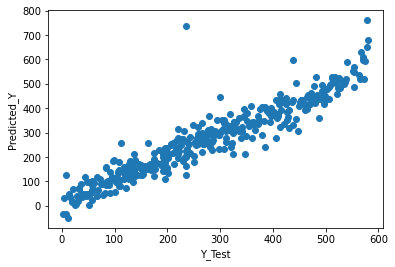

In [435]:
plt.scatter(x=y_test,y=pred)
plt.xlabel('Y_Test')
plt.ylabel('Predicted_Y')

### Hypertuned Prediction

### Test Data Prediction

In [436]:
tes = df3.iloc[1168:]

In [437]:
test_da = tes.drop(['SalePrice'],axis=1)

In [438]:
for i in test_da.columns:
    scaler = StandardScaler()
    test_da[i] = scaler.fit_transform(test_da[i].values.reshape(-1, 1))

In [439]:
test_da.shape

(292, 75)

In [441]:
SGDR = SGDRegressor(penalty='l1',max_iter=100,alpha=0.0003,random_state=84)
SGDR.fit(X_train,y_train)
pred = SGDR.predict(test_da)

In [442]:
pred.shape

(292,)

In [443]:
SalePrice = pd.DataFrame(pred).reset_index()

In [444]:
Test = pd.DataFrame(test_da).reset_index()

In [445]:
Hypertuned_Sale_Price = pd.concat([Test,SalePrice],axis=1)
Hypertuned_Sale_Price

,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,index,0
0,1168,-0.980984,-0.142702,1.016773,1.406597,0.083045,-1.402669,-2.566101,-0.058621,-2.001106,-0.226274,1.552004,-0.032019,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.098331,1.031595,1.846195,-0.082534,0.738004,0.745726,1.952161,0.717433,-0.857858,0.343557,0.776109,-2.549340,0.227757,-1.192678,-0.410373,1.812583,0.296045,-0.311929,0.453795,1.874792,-0.141879,-0.834476,0.248633,0.315635,1.841273,-0.704459,-0.095292,1.115494,1.132656,-0.263813,0.776457,-0.727992,0.254952,-0.217895,-0.469314,0.917136,0.234764,0.651586,-0.429570,-0.659455,1.106508,-1.474589,1.687009,1.232832,0.216962,0.181711,0.281378,0.821326,0.069769,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.276960,-0.650908,0.242421,0.211151,0,550.095502
1,1169,1.608104,-0.142702,0.178819,-1.134788,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.552004,-0.032019,-0.058621,2.722077,-0.518671,1.419117,-0.464603,0.367937,-0.064496,-0.523427,-0.082534,-1.186077,-1.265177,0.355435,-0.678669,-0.857858,0.343557,-0.518884,-0.303768,0.227757,-2.090260,-0.410373,1.514568,0.296045,-0.311929,-1.048628,0.578663,-0.141879,0.345510,0.248633,0.315635,0.790986,-0.704459,-0.095292,-0.223882,1.132656,-0.263813,-1.051974,-0.727992,-2.226584,-0.217895,-0.469314,-1.401511,0.234764,0.651586,-2.710193,-0.659455,0.199651,-0.254816,0.359228,0.615374,0.216962,0.181711,0.281378,-0.356551,-0.746805,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.637997,0.863555,-6.266715,-3.583077,1,291.810750
2,1170,-0.980984,-0.142702,0.178819,0.885453,0.083045,0.745474,0.299297,-0.058621,0.598774,-0.226274,-1.277283,-0.032019,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,0.959208,0.782483,1.846195,-0.082534,0.738004,0.745726,0.355435,-0.678669,-0.857858,0.343557,0.776109,-0.303768,0.227757,-2.090260,1.223659,-1.003656,0.296045,-0.311929,2.049827,1.748103,-0.141879,-0.834476,0.248633,0.315635,1.717710,-0.704459,-0.095292,0.876624,-0.836008,-0.263813,0.776457,-0.727992,0.254952,-0.217895,-2.916451,0.337474,0.234764,0.651586,1.851054,-0.659455,0.933773,-0.254816,0.359228,0.349523,0.216962,0.181711,0.281378,1.122977,1.891355,-0.327559,-0.083011,-0.246064,0.0,-0.160609,-0.084077,0.863555,0.242421,0.211151,2,429.369807
3,1171,0.431246,-0.142702,0.440679,0.946575,0.083045,0.745474,-3.998799,-0.058621,0.598774,-0.226274,-1.110854,-0.032019,-0.058621,-0.444642,1.011146,0.680468,1.419621,-1.058071,-1.758454,-0.523427,-0.082534,-0.544717,-0.690633,0.355435,-0.678669,0.633181,0.343557,-0.518884,0.819019,0.227757,0.602487,0.678982,-0.531800,0.296045,-0.311929,-0.229550,-1.019572,-0.141879,-0.834476,0.248633,0.315635,-0.843849,0.586882,-0.095292,0.309309,-0.836008,-0.263813,-1.051974,1.296518,0.254952,-0.217895,-1.692883,0.337474,0.234764,0.651586,-0.429570,-0.659455,-1.614064,0.964957,-0.968552,-1.211275,0.216962,0.181711,0.281378,-0.701295,-0.746805,-0.327559,-0.083011,-0.246064,0.0,-0.160609,0.276960,0.863555,0.242421,0.211151,3,251.589888
4,1172,0.195874,-0.142702,1.016773,1.470936,0.083045,-1.402669,0.299297,-0.058621,-1.351136,-0.226274,1.385575,-1.200730,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,1.167892,1.081417,-0.523427,-0.082534,0.738004,0.745726,1.952161,-0.270578,-0.857858,0.34355